In [120]:
%load_ext autoreload
%autoreload 2
from cosypose.rendering.bullet_scene_renderer import BulletSceneRenderer
from cosypose.datasets.datasets_cfg import make_scene_dataset
from bokeh.io import output_notebook, show; output_notebook()
from bokeh.plotting import gridplot
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from cosypose.lib3d import Transform
from cosypose.visualization.plotter import Plotter
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Loading BokehJS ...

In [121]:
# ds_name, urdf_ds_name = 'synthetic.ycbv-1M.train', 'ycbv'
# ds_name, urdf_ds_name = 'tless.primesense.test', 'tless.cad'
ds_name, urdf_ds_name = 'bracket_assembly', 'bracket_assembly'
scene_ds = make_scene_dataset(ds_name)

1 day, 21:38:38.805663 - Building index and loading annotations...


[Memory]164318.9s, 2738.6min: Loading build_index...


In [128]:
def get_random_image(scene_ds, idx=None):
    renderer = BulletSceneRenderer(urdf_ds_name)
    if idx is None:
        idx = np.random.randint(len(scene_ds))
#     print("idx:", idx)
    ds_rgb, mask, state = scene_ds[idx]
    
    objects = state['objects']
    camera = state['camera']
    print([o['bbox'] for o in objects])
#     print(camera)
    cameras = [camera]
    image = renderer.render_scene(objects, cameras)[0]['rgb']
    renderer.disconnect()
    return ds_rgb, image

ds_rgb, render_rgb = get_random_image(scene_ds, idx=20)

plotter = Plotter()
fig_ds_rgb = plotter.plot_image(ds_rgb)
fig_render_rgb = plotter.plot_image(render_rgb)
fig_overlay = plotter.plot_overlay(ds_rgb, render_rgb)
fig_dets = plotter.plot_maskrcnn_bboxes(fig_ds_rgb, scene_ds[20])
show(gridplot([[fig_ds_rgb, fig_render_rgb, fig_overlay, fig_dets]], sizing_mode='scale_width'))

EGL device choice: 0 of 4 (from EGL_VISIBLE_DEVICES)


[[245, 99, 293, 155], [213, 151, 261, 203], [249, 191, 301, 237], [319, 148, 402, 224], [297, 174, 355, 242], [271, 193, 516, 391], [306, 46, 502, 196]]
Loaded EGL 1.5 after reload.
GL_VENDOR=NVIDIA Corporation
GL_RENDERER=Tesla T4/PCIe/SSE2
GL_VERSION=4.6.0 NVIDIA 510.73.08
GL_SHADING_LANGUAGE_VERSION=4.60 NVIDIA
Version = 4.6.0 NVIDIA 510.73.08
Vendor = NVIDIA Corporation
Renderer = Tesla T4/PCIe/SSE2
ven = NVIDIA Corporation


AttributeError: 'tuple' object has no attribute 'infos'

Destroy EGL OpenGL window.


In [123]:
image

Figure(id='11978', ...)

In [126]:

ds_name, urdf_ds_name = 'tless.primesense.test', 'tless.cad'
scene_ds = make_scene_dataset(ds_name)
def get_random_image(scene_ds, idx=None):
    renderer = BulletSceneRenderer(urdf_ds_name)
    if idx is None:
        idx = np.random.randint(len(scene_ds))
    print("idx:", idx)
    ds_rgb, mask, state = scene_ds[idx]
    
    objects = state['objects']
    camera = state['camera']
#     print(objects)
#     print(camera)
    print([obj['bbox'] for obj in objects])
    cameras = [camera]
    image = renderer.render_scene(objects, cameras)[0]['rgb']
    renderer.disconnect()
    return ds_rgb, image

ds_rgb, render_rgb = get_random_image(scene_ds)

plotter = Plotter()
fig_ds_rgb = plotter.plot_image(ds_rgb)
fig_render_rgb = plotter.plot_image(render_rgb)
fig_overlay = plotter.plot_overlay(ds_rgb, render_rgb)
show(gridplot([[fig_ds_rgb, fig_render_rgb, fig_overlay]], sizing_mode='scale_width'))

1 day, 21:39:07.850748 - Building index and loading annotations...


[Memory]164347.9s, 2739.1min: Loading build_index...
idx: 2518
[[284, 172, 406, 195], [163, 173, 302, 276], [440, 213, 550, 301], [283, 191, 449, 350], [197, 163, 347, 187], [411, 151, 515, 224]]
Loaded EGL 1.5 after reload.
GL_VENDOR=NVIDIA Corporation
GL_RENDERER=Tesla T4/PCIe/SSE2
GL_VERSION=4.6.0 NVIDIA 510.73.08
GL_SHADING_LANGUAGE_VERSION=4.60 NVIDIA
Version = 4.6.0 NVIDIA 510.73.08
Vendor = NVIDIA Corporation
Renderer = Tesla T4/PCIe/SSE2


EGL device choice: 0 of 4 (from EGL_VISIBLE_DEVICES)


ven = NVIDIA Corporation
Destroy EGL OpenGL window.


In [117]:
from pathlib import Path
import torch
LOCAL_DATA = Path('/home/ubuntu/synthetic_pose_estimation/cosypose/local_data')
DEBUG_DATA_DIR = LOCAL_DATA / 'debug_data'
debug_file = open(DEBUG_DATA_DIR/'debug_iter=1.pth.tar','rb')
debug_data = torch.load(debug_file)
print(len(debug_data['images']))

7


(540, 720, 3)
(7, 2000, 2)
uv [-551.3737   368.70416]
uv [496.45682 281.40353]
uv [496.9783  436.14252]
uv [387.79633 565.01886]
uv [-519.9719   491.50146]
uv [ 209.47897 -194.22852]
uv [155.40045 273.64175]


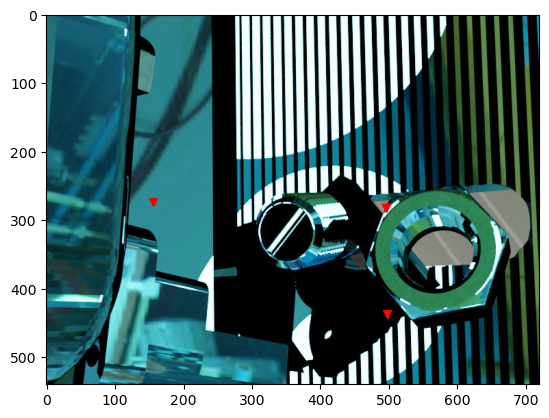

In [118]:
import matplotlib.pyplot as plt
im = debug_data['images'][0].cpu().numpy()
if im.shape[0] == 3:
    im = im.transpose((1, 2, 0))
    im = im[..., :4]
    print(im.shape)
imgplot = plt.imshow(im)
uv = debug_data['uv'].cpu().numpy()
print(uv.shape)
for i in range(uv.shape[0]):    
    print("uv", uv[i,0,...])
    plt.plot(uv[i,0,0], uv[i,0,1], marker='v', color="red")
plt.imshow(im)
plt.show()

In [130]:
print(debug_data["boxes_crop"])
print(debug_data["boxes_rend"])

tensor([[-3266.7812, -2466.7112,  4029.7812,  3005.7112],
        [  177.8391,   149.8793,   610.1609,   474.1207],
        [  169.2897,    46.9673,   978.7103,   654.0327],
        [ -128.2534,   -40.8150,   991.2534,   798.8150],
        [-1096.6555,  -604.7416,  1234.6555,  1143.7417],
        [ -678.4442,  -502.9581,   837.4442,   633.9581],
        [ -580.9443,  -150.9582,   934.9443,   985.9582]], device='cuda:0')
tensor([[-2224.4153,   269.5000,  2987.4150,   926.7827],
        [  282.2271,   196.1995,   510.8336,   426.4377],
        [  374.3394,   133.6909,   729.5110,   536.6177],
        [  194.0231,   213.5258,   659.3652,   678.8679],
        [ -710.6967,  -354.9583,   428.3487,   581.6288],
        [ -147.5733,  -340.5415,   366.8008,   217.0080],
        [  -51.2013,    11.4584,   463.7428,   570.6818]], device='cuda:0')


In [31]:
for key, value in debug_data.items():
#     if key == "images_crop":
    print(key, value)

boxes_rend tensor([[-1043.2275,  -730.4111, -1011.7446,  -709.8492]], device='cuda:0')
rend_center_uv tensor([[[-1012.5711,  -710.5408]]], device='cuda:0')
uv tensor([[[-1029.1736,  -715.4337],
         [-1030.3945,  -720.5253],
         [-1036.9443,  -718.5473],
         ...,
         [-1038.0593,  -715.4976],
         [-1041.6578,  -717.5955],
         [-1037.3180,  -715.1656]]], device='cuda:0')
boxes_crop tensor([[-1055.4901,  -742.7300,  -969.6521,  -678.3515]], device='cuda:0')
TCO_input tensor([[[-0.3556,  0.5493,  0.7562, -2.8986],
         [-0.7925, -0.6061,  0.0676, -2.0704],
         [ 0.4955, -0.5752,  0.6509,  3.0963],
         [ 0.0000,  0.0000,  0.0000,  1.0000]]], device='cuda:0')
TCO_output tensor([[[ -0.3319,   0.5378,   0.7750, -12.0943],
         [ -0.7132,  -0.6808,   0.1669,  -8.5493],
         [  0.6174,  -0.4974,   0.6095,  13.0572],
         [  0.0000,   0.0000,   0.0000,   1.0000]]], device='cuda:0')
K_crop tensor([[[5.4639e+03, 0.0000e+00, 5.2745e+03],
      

In [119]:
plotter = Plotter()
image = plotter.plot_image(debug_data['images'][0])
image = plotter.plot_maskrcnn_bboxes(image, debug_data['boxes_crop'],  text_auto=False) 
show(image)
# fig_overlay = plotter.plot_overlay(ds_rgb, render_rgb)

In [132]:

for p in points:
    

torch.Size([7, 2000, 3])

In [131]:
plotted = []
for img in debug_data['images_crop']:
    plotted.append(plotter.plot_image(img))
show(gridplot([plotted], sizing_mode='scale_width'))